In [1]:
#!/usr/bin/python                                                       
# Author: Siddhartha Gairola (siddhartha dot gairola at iiit dot ac dot in)
from __future__ import division                                         
import cv2                                                              
import os                                                               
import pickle                                                           
import pdb                                                              
import json                                                             
import pickle as pkl                                                    
import numpy as np                                                      
from tqdm import tqdm                                                   
import random                                                                                         
from sklearn.preprocessing import normalize                             
                                                                        
import matplotlib.pyplot as plt                                         
#matplotlit.use('Agg')                                                  
                                                                        
import time                                                             
                                                                        
# This is a bit of magic to make matplotlib figures appear inline in the notebook
# rather than in a new window.                                          
%matplotlib inline                                                     
plt.rcParams['figure.figsize'] = (200.0, 160.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'                         
plt.rcParams['image.cmap'] = 'gray'                                     
                                                                        
# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2                                                         
print ("Import Successful")

Import Successful


In [2]:
f = open('top_K.json', 'r')                                            
s = f.read()
j = json.loads(s)                                                       
f.close()

In [3]:
j_keys = []
for k in j:
    j_keys.append(k)

random.shuffle(j_keys)
j_keys[:10]


['75140575_10259687.jpg',
 'd101092897_14672421.jpg',
 '154816201_23311559.jpg',
 '224824583_35856955.jpg',
 'd212285465_33566471.jpg',
 '54358321_7080877.jpg',
 '189075923_29295801.jpg',
 '171679427_26188155.jpg',
 '46056935_1821461.jpg',
 '192728351_29953257.jpg']

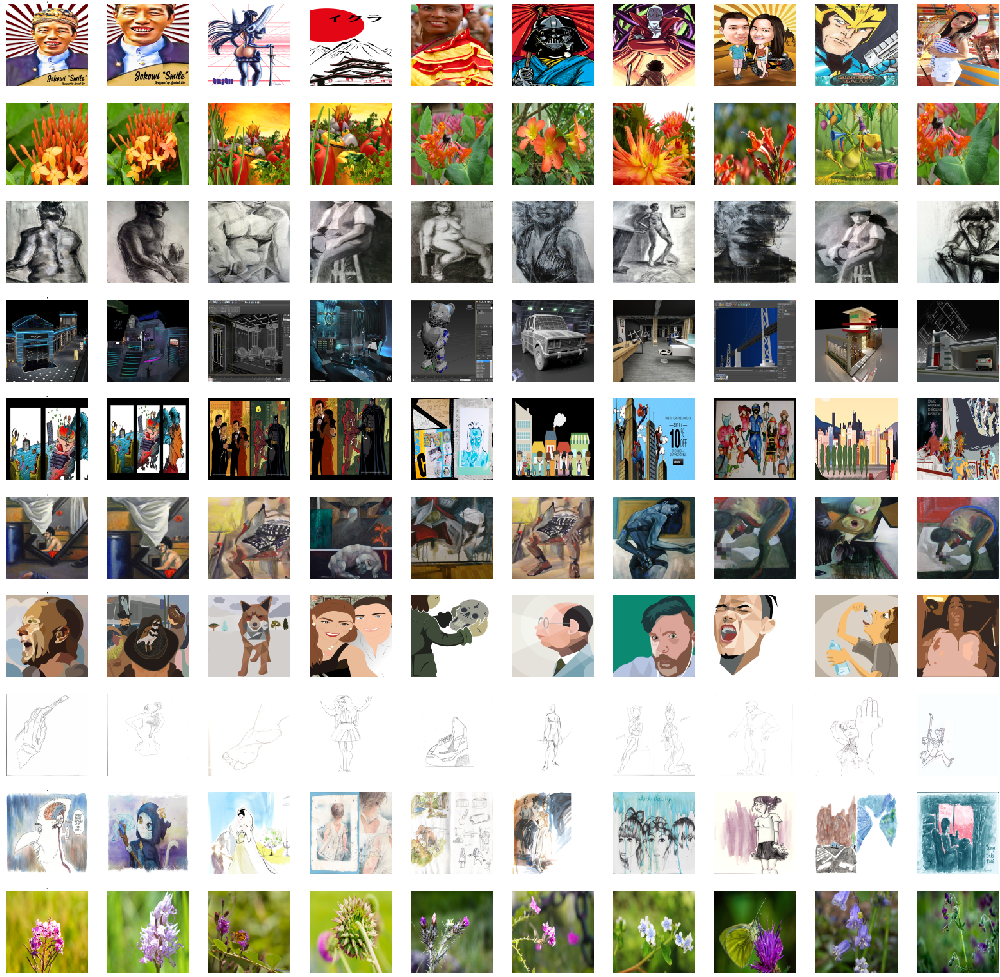

In [4]:
# We show a few examples of training images from each class.
classes = range(0,10)
#classes = np.random.choice(classes, 5, replace=False)
num_classes = len(classes)
samples_per_class = 10
plt.figure(figsize=(50*2,50*2))
images_content = []
for y, cls in enumerate(classes):
    images = []
    name = j_keys[y]
    im = cv2.imread('/scratch/bam_subset_2_0/'+name)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (128,128), interpolation = cv2.INTER_AREA)
    images.append(im)
    for i in range(samples_per_class-1):
        name = j[j_keys[y]][i]
        im = cv2.imread('/scratch/bam_subset_2_0/'+name)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        im = cv2.resize(im, (128,128), interpolation = cv2.INTER_AREA)
        images.append(im)
        
    idxs = range(len(images))
    images_content.append(images)
    
    for i, idx in enumerate(idxs):
        #plt_idx = i * num_classes + y + 1
        plt_idx = y * samples_per_class + i + 1
        #plt.subplot(samples_per_class, num_classes, plt_idx)
        ax = plt.subplot(num_classes, samples_per_class, plt_idx)
        ax.imshow(images[idx].astype('uint8'))
        ax.axis('off')
        #plt.axis('off')
        if i == 0:
            plt.title(cls)
#plt.savefig('./results/classification_rep_1.png')
plt.show()

In [5]:
# Now running for the bottom neighbours
f = open('bottom_K.json', 'r')                                            
s = f.read()
j = json.loads(s)                                                       
f.close()

In [8]:
j_keys = []
for k in j:
    j_keys.append(k)

random.shuffle(j_keys)
j_keys[:10]

['d140702933_20960551.jpg',
 '154214795_23206443.jpg',
 'd82973413_11481163.jpg',
 'd103332053_15030957.jpg',
 'd102560751_14906147.jpg',
 '81035153_11179971.jpg',
 'd77004329_10213293.jpg',
 'd145366319_21727191.jpg',
 '37957199_4802809.jpg',
 '138626317_20620333.jpg']

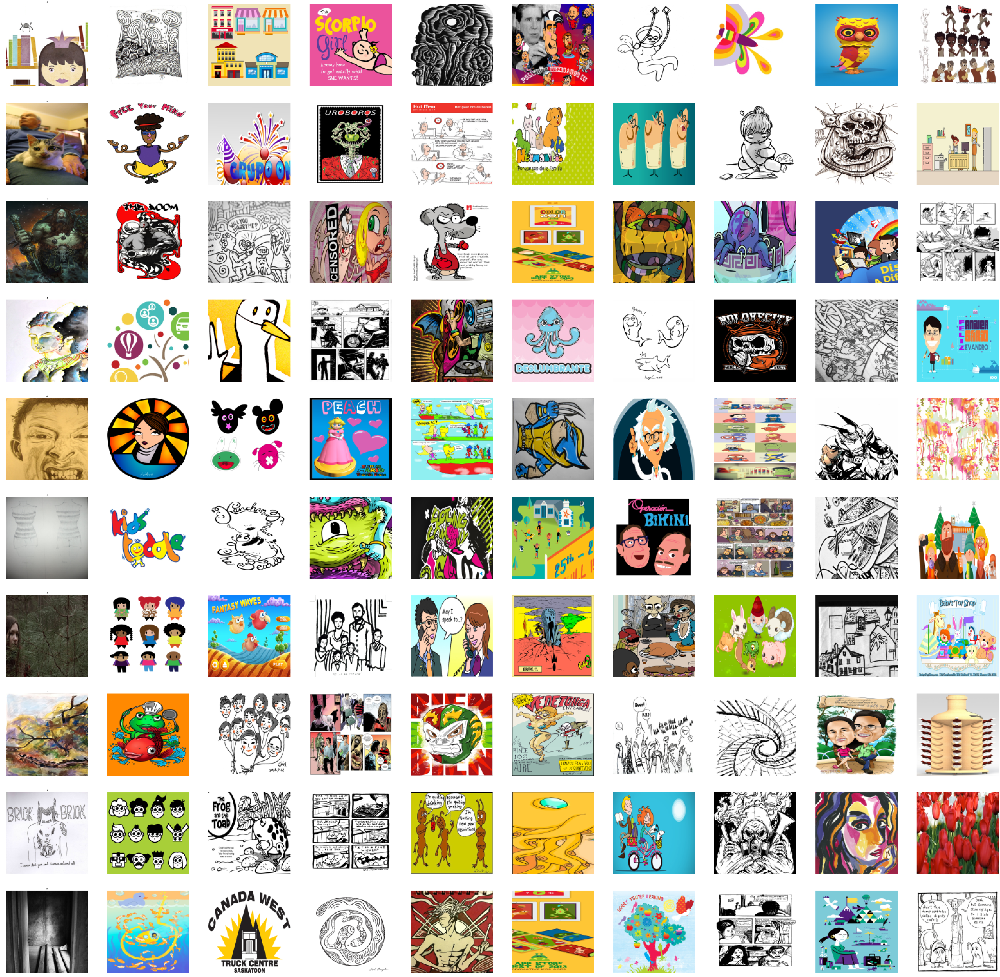

In [9]:
# We show a few examples of training images from each class.
classes = range(0,10)
#classes = np.random.choice(classes, 5, replace=False)
num_classes = len(classes)
samples_per_class = 10
plt.figure(figsize=(50*2,50*2))
images_content = []
for y, cls in enumerate(classes):
    images = []
    name = j_keys[y]
    im = cv2.imread('/scratch/bam_subset_2_0/'+name)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    im = cv2.resize(im, (128,128), interpolation = cv2.INTER_AREA)
    images.append(im)
    for i in range(samples_per_class-1):
        name = j[j_keys[y]][i]
        im = cv2.imread('/scratch/bam_subset_2_0/'+name)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
        im = cv2.resize(im, (128,128), interpolation = cv2.INTER_AREA)
        images.append(im)
        
    idxs = range(len(images))
    images_content.append(images)
    
    for i, idx in enumerate(idxs):
        #plt_idx = i * num_classes + y + 1
        plt_idx = y * samples_per_class + i + 1
        #plt.subplot(samples_per_class, num_classes, plt_idx)
        ax = plt.subplot(num_classes, samples_per_class, plt_idx)
        ax.imshow(images[idx].astype('uint8'))
        ax.axis('off')
        #plt.axis('off')
        if i == 0:
            plt.title(cls)
#plt.savefig('./results/classification_rep_1.png')
plt.show()